In [1]:
# Import standard packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns',100)

In [2]:
# Load data 
fpath =  "ames-housing-dojo-for-ml.csv"
df = pd.read_csv(fpath)
df = df.set_index("PID")
# Define columns to use
columns_to_use = columns_to_use = ['SalePrice', 'Living Area Sqft', 'Lot Frontage', 'Bldg Type', 'Bedroom','Total Full Baths','MS Zoning','Street', 'Alley','Utilities']
df = df[columns_to_use]
df.head()

,SalePrice,Living Area Sqft,Lot Frontage,Bldg Type,Bedroom,Total Full Baths,MS Zoning,Street,Alley,Utilities
PID,,,,,,,,,,
907227090,119900.0,864.0,60.0,1Fam,3,1.0,RL,Pave,NaN,AllPub
527108010,320000.0,2462.0,134.0,1Fam,4,3.0,RL,Pave,NaN,AllPub
534275170,151500.0,958.0,NaN,1Fam,2,1.0,RL,Pave,NaN,AllPub
528104050,385000.0,2084.0,114.0,1Fam,2,3.0,RL,Pave,NaN,AllPub
533206070,193800.0,1565.0,32.0,TwnhsE,2,3.0,FV,Pave,Pave,AllPub


In [3]:
# Select columns to use
columns_to_use = ['SalePrice', 'Living Area Sqft', 'Lot Frontage', 'Bldg Type', 'Bedroom',
                      'Total Full Baths','MS Zoning','Street', 
                      'Alley','Utilities']

# Functionizing the load data from above for .py file
def load_data():
    fpath =  "ames-housing-dojo-for-ml.csv"
    df = pd.read_csv(fpath)
    df = df.set_index("PID")

    df = df[columns_to_use]
    return df

In [4]:
# Verify the function works as expected
df = load_data()
df.head()

,SalePrice,Living Area Sqft,Lot Frontage,Bldg Type,Bedroom,Total Full Baths,MS Zoning,Street,Alley,Utilities
PID,,,,,,,,,,
907227090,119900.0,864.0,60.0,1Fam,3,1.0,RL,Pave,NaN,AllPub
527108010,320000.0,2462.0,134.0,1Fam,4,3.0,RL,Pave,NaN,AllPub
534275170,151500.0,958.0,NaN,1Fam,2,1.0,RL,Pave,NaN,AllPub
528104050,385000.0,2084.0,114.0,1Fam,2,3.0,RL,Pave,NaN,AllPub
533206070,193800.0,1565.0,32.0,TwnhsE,2,3.0,FV,Pave,Pave,AllPub


In [5]:
# Obtain summary statistics
df.describe().round(2)

,SalePrice,Living Area Sqft,Lot Frontage,Bedroom,Total Full Baths
count,2930.00,2930.00,2440.00,2930.00,2928.00
mean,180825.07,1499.69,69.22,2.85,2.00
std,79878.22,505.51,23.37,0.83,0.75
min,12789.00,334.00,21.00,0.00,0.00
25%,129500.00,1126.00,58.00,2.00,1.00
50%,160000.00,1442.00,68.00,3.00,2.00
75%,213500.00,1742.75,80.00,3.00,2.00
max,755000.00,5642.00,313.00,8.00,6.00


In [6]:
# In our notebook we can use df.info() to output our summary info into our console (direclty below the cell)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2930 entries, 907227090 to 902201120
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   SalePrice         2930 non-null   float64
 1   Living Area Sqft  2930 non-null   float64
 2   Lot Frontage      2440 non-null   float64
 3   Bldg Type         2930 non-null   object 
 4   Bedroom           2930 non-null   int64  
 5   Total Full Baths  2928 non-null   float64
 6   MS Zoning         2930 non-null   object 
 7   Street            2930 non-null   object 
 8   Alley             198 non-null    object 
 9   Utilities         2930 non-null   object 
dtypes: float64(4), int64(1), object(5)
memory usage: 251.8+ KB


In [7]:
# Display .info()
# In order to display output on our app, we first need to capture it. 
# We can use an IO buffer to capture the output, then we will use the getvalue() argument to retrive it


from io import StringIO

# Create a string buffer to capture the content
buffer = StringIO()
# Write the info into the buffer
df.info(buf=buffer)
# Retrieve the content from the buffer
summary_info = buffer.getvalue()

In [8]:
# What the output looks like in the console
summary_info

"<class 'pandas.core.frame.DataFrame'>\nInt64Index: 2930 entries, 907227090 to 902201120\nData columns (total 10 columns):\n #   Column            Non-Null Count  Dtype  \n---  ------            --------------  -----  \n 0   SalePrice         2930 non-null   float64\n 1   Living Area Sqft  2930 non-null   float64\n 2   Lot Frontage      2440 non-null   float64\n 3   Bldg Type         2930 non-null   object \n 4   Bedroom           2930 non-null   int64  \n 5   Total Full Baths  2928 non-null   float64\n 6   MS Zoning         2930 non-null   object \n 7   Street            2930 non-null   object \n 8   Alley             198 non-null    object \n 9   Utilities         2930 non-null   object \ndtypes: float64(4), int64(1), object(5)\nmemory usage: 251.8+ KB\n"

In [9]:
# Displaying null values
nulls =df.isna().sum()
nulls

SalePrice              0
Living Area Sqft       0
Lot Frontage         490
Bldg Type              0
Bedroom                0
Total Full Baths       2
MS Zoning              0
Street                 0
Alley               2732
Utilities              0
dtype: int64

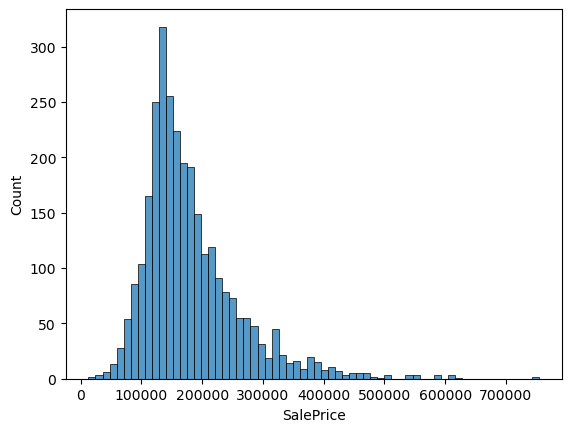

In [10]:
# Histogram
sns.histplot(data = df, x = 'SalePrice');

In [11]:
# Function for returning a histogram fig
def plot_hist(df, column):
    fig, ax = plt.subplots()
    sns.histplot(data = df, x = column)
    return fig

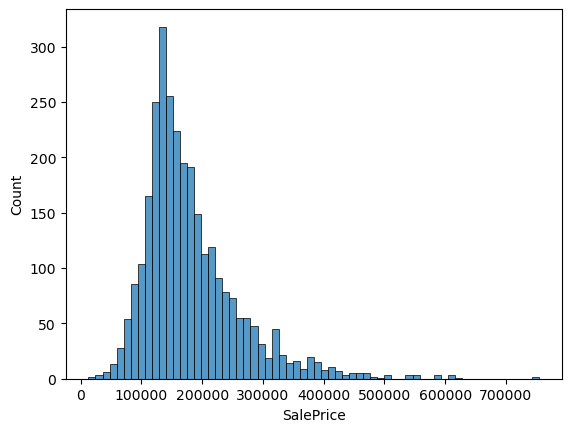

In [12]:
# Test the function
fig = plot_hist(df, 'SalePrice')

In [13]:
# Revisiting original custom function for exploring categorical values
# Original from LP week 4
def explore_categorical(df, x, fillna = True, placeholder = 'MISSING',
                        figsize = (6,4), order = None):
 
  # Make a copy of the dataframe and fillna 
  temp_df = df.copy()
  # Before filling nulls, save null value counts and percent for printing 
  null_count = temp_df[x].isna().sum()
  null_perc = null_count/len(temp_df)* 100
  # fillna with placeholder
  if fillna == True:
    temp_df[x] = temp_df[x].fillna(placeholder)
  # Create figure with desired figsize
  fig, ax = plt.subplots(figsize=figsize)
  # Plotting a count plot 
  sns.countplot(data=temp_df, x=x, ax=ax, order=order)
  # Rotate Tick Labels for long names
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
  # Add a title with the feature name included
  ax.set_title(f"Column: {x}")
  
  # Fix layout and show plot (before print statements)
  fig.tight_layout()
  plt.show()
      
  # Print null value info
  print(f"- NaN's Found: {null_count} ({round(null_perc,2)}%)")
  # Print cardinality info
  nunique = temp_df[x].nunique()
  print(f"- Unique Values: {nunique}")
  # First find value counts of feature
  val_counts = temp_df[x].value_counts(dropna=False)
  # Define the most common value
  most_common_val = val_counts.index[0]
  # Define the frequency of the most common value
  freq = val_counts.values[0]
  # Calculate the percentage of the most common value
  perc_most_common = freq / len(temp_df) * 100
  # Print the results
  print(f"- Most common value: '{most_common_val}' occurs {freq} times ({round(perc_most_common,2)}%)")
  # print message if quasi-constant or constant (most common val more than 98% of data)
  if perc_most_common > 98:
    print(f"\n- [!] Warning: '{x}' is a constant or quasi-constant feature and should be dropped.")
  else:
    print("- Not constant or quasi-constant.")
  return fig, ax

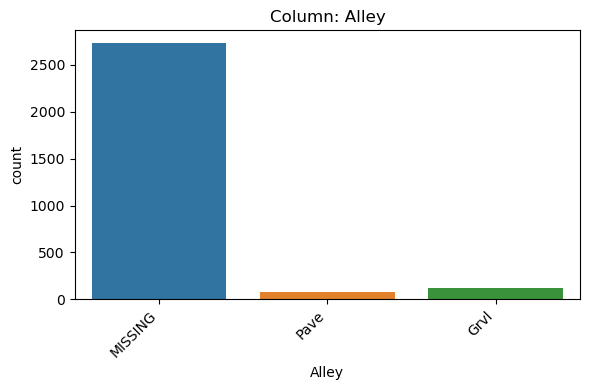

- NaN's Found: 2732 (93.24%)
- Unique Values: 3
- Most common value: 'MISSING' occurs 2732 times (93.24%)
- Not constant or quasi-constant.


In [14]:
# Review function output
explore_categorical(df, 'Alley');

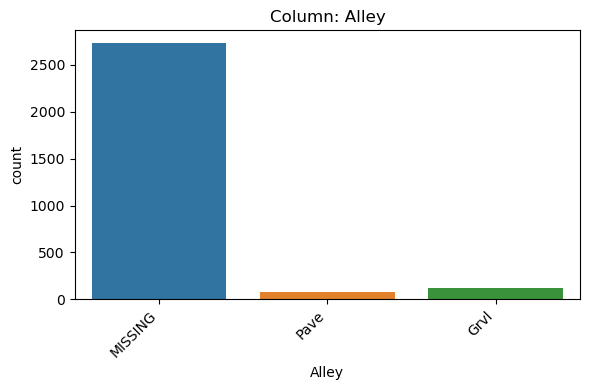

- NaN's Found: 2732 (93.24%)
- Unique Values: 3
- Most common value: 'MISSING' occurs 2732 times (93.24%)
- Not constant or quasi-constant.


In [15]:
# Save the output of the function
fig, ax = explore_categorical(df, 'Alley')

In [16]:
def explore_numeric(df, x, figsize=(6,5) ):
  # Making our figure with gridspec for subplots
  gridspec = {'height_ratios':[0.7,0.3]}
  fig, axes = plt.subplots(nrows=2, figsize=figsize,
                           sharex=True, gridspec_kw=gridspec)
  # Histogram on Top
  sns.histplot(data=df, x=x, ax=axes[0])
  # Boxplot on Bottom
  sns.boxplot(data=df, x=x, ax=axes[1])
  ## Adding a title
  axes[0].set_title(f"Column: {x}")
  ## Adjusting subplots to best fill Figure
  fig.tight_layout()
  
  # Ensure plot is shown before message
  plt.show()
  ## Print message with info on the count and % of null values
  null_count = df[x].isna().sum()
  null_perc = null_count/len(df)* 100
  print(f"- NaN's Found: {null_count} ({round(null_perc,2)}%)")
  return fig

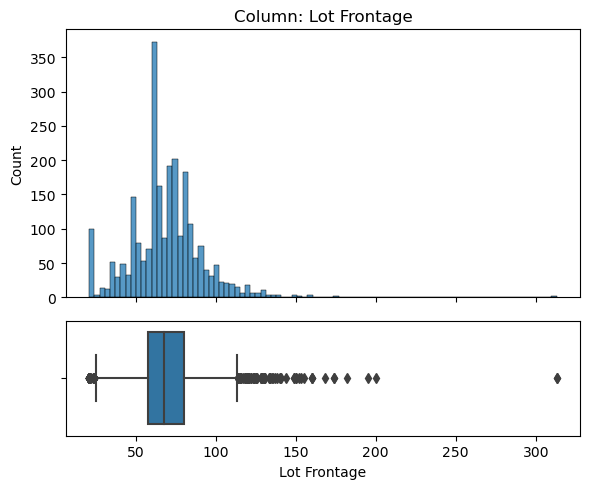

- NaN's Found: 490 (16.72%)


In [17]:
# Review output
fig = explore_numeric(df, 'Lot Frontage')

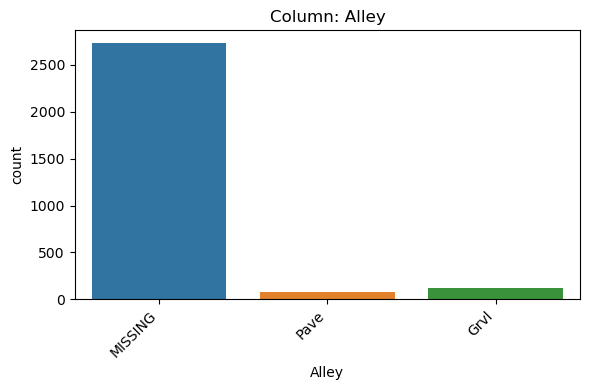

- NaN's Found: 2732 (93.24%)
- Unique Values: 3
- Most common value: 'MISSING' occurs 2732 times (93.24%)
- Not constant or quasi-constant.


In [18]:
# Try a categorical column to test conditional statement
column = 'Alley'
if df[column].dtype == 'object':
    fig = explore_categorical(df, column)
else:
    fig = explore_numeric(df, column)

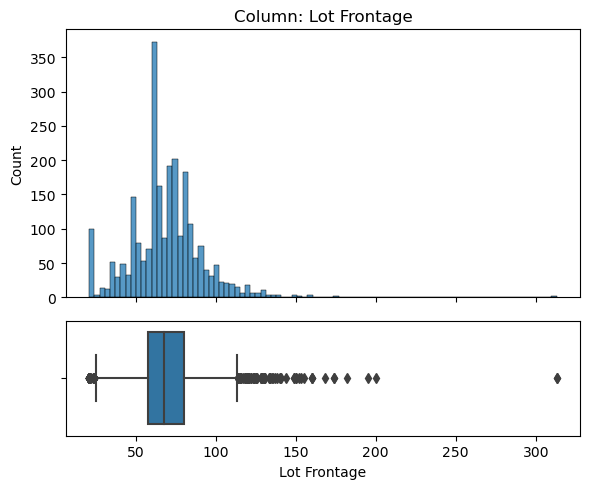

- NaN's Found: 490 (16.72%)


In [19]:
# Try a numeric column to test conditional statement
column = 'Lot Frontage'
if df[column].dtype == 'object':
    fig = explore_categorical(df, column)
else:
    fig = explore_numeric(df, column)

In [20]:
import plotly.express as px
import plotly.io as pio

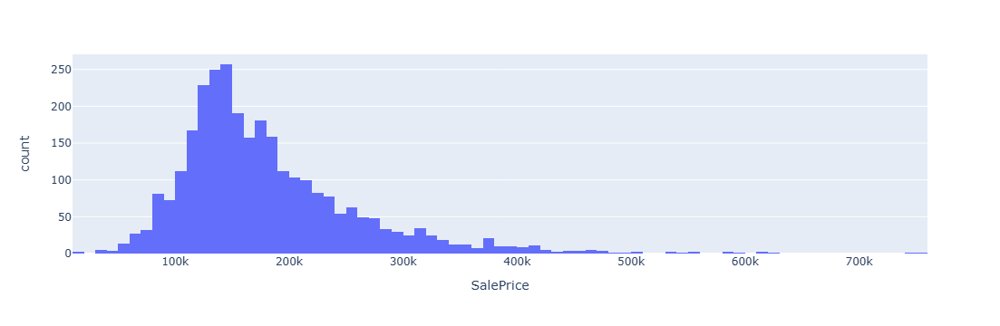

In [21]:
# Recreate our explore_numeric visual
px.histogram(df,x='SalePrice')

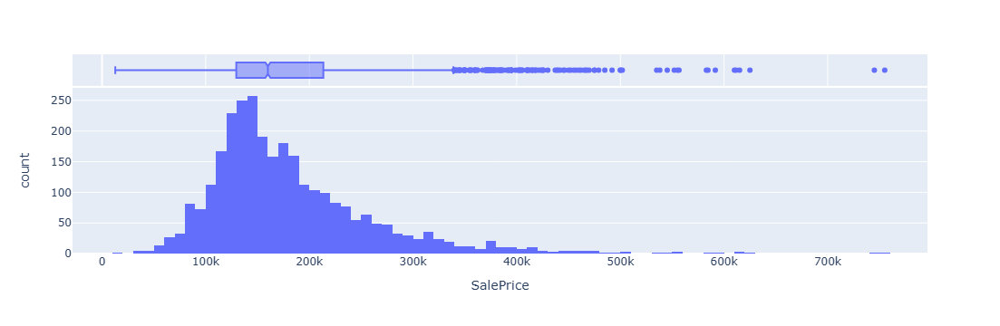

In [22]:
# Add a boxplot to the histogram
px.histogram(df,x='SalePrice',marginal='box')

In [23]:
# Define as function
def plotly_explore_numeric(df, x):
    fig = px.histogram(df,x=x,marginal='box',title=f'Distribution of {x}', 
                      width=1000, height=500)
    return fig

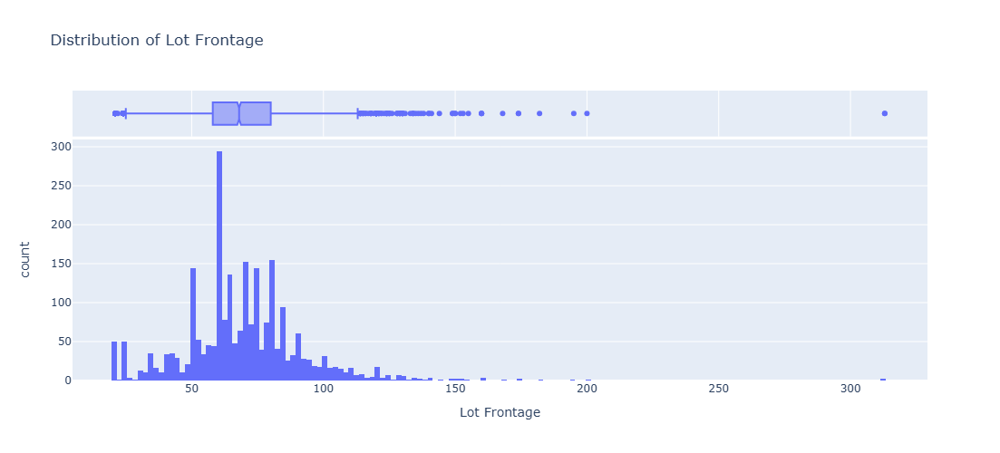

In [24]:
# Test the function
plotly_explore_numeric(df,'Lot Frontage')

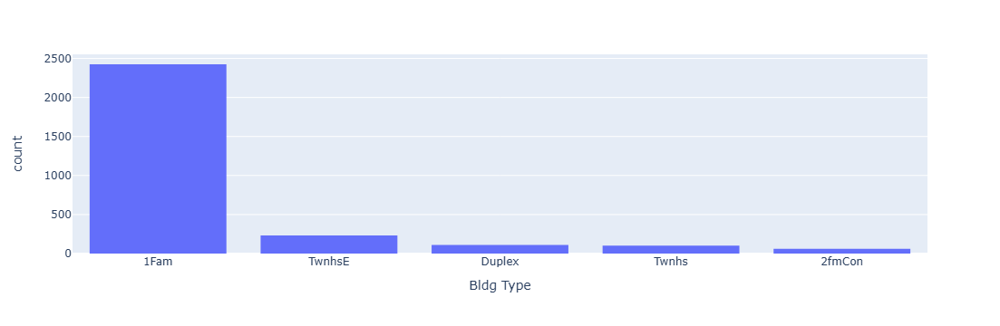

In [25]:
# Histogram for categorical data
px.histogram(df, 'Bldg Type')

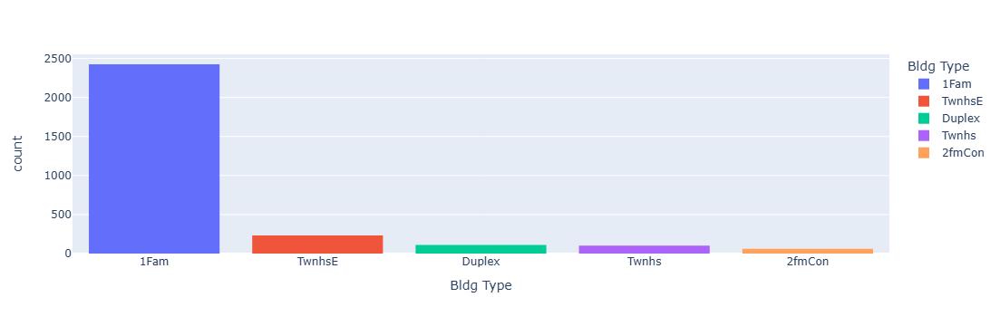

In [26]:
# Add color argument
px.histogram(df, x ='Bldg Type', color = 'Bldg Type')

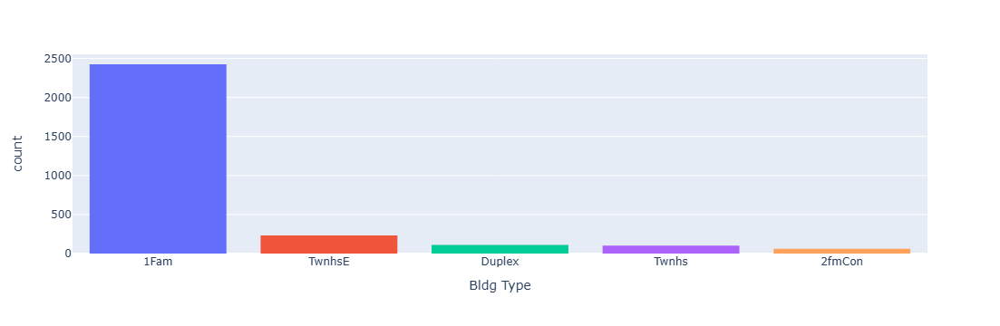

In [27]:
# Customize to remove the legend
fig = px.histogram(df, x ='Bldg Type', color = 'Bldg Type')
fig.update_layout(showlegend=False)

In [28]:
def plotly_explore_categorical(df, x):
    fig = px.histogram(df,x=x,color=x,title=f'Distribution of {x}', 
                          width=1000, height=500)
    fig.update_layout(showlegend=False)
    return fig

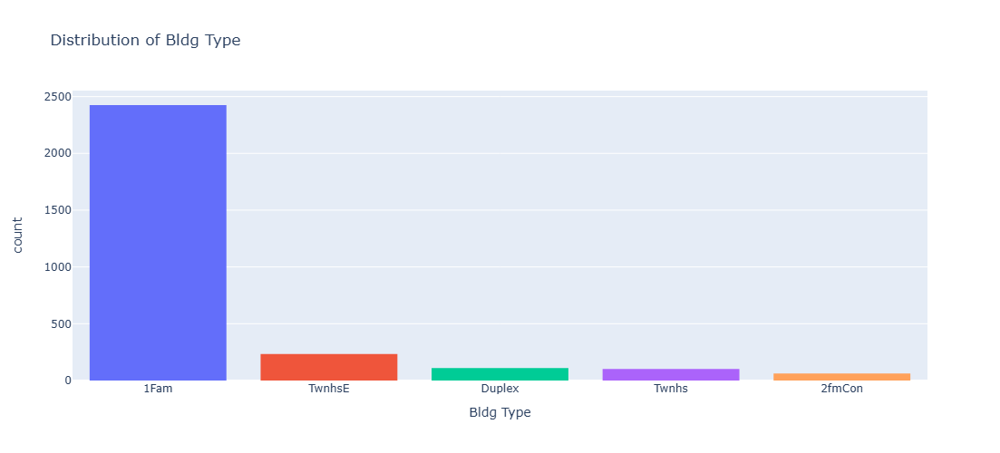

In [29]:
# Test the function
plotly_explore_categorical(df, 'Bldg Type')

In [30]:
# Templates for overhauling plotly aesthetics
pio.templates

Templates configuration
-----------------------
    Default template: 'plotly'
    Available templates:
        ['ggplot2', 'seaborn', 'simple_white', 'plotly',
         'plotly_white', 'plotly_dark', 'presentation', 'xgridoff',
         'ygridoff', 'gridon', 'none']

In [31]:
# Setting the default to seaborn
pio.templates.default='seaborn'

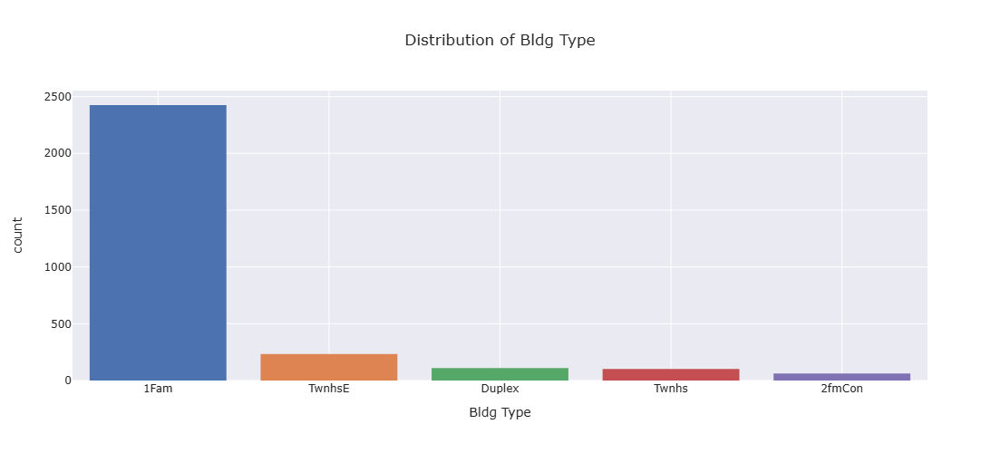

In [32]:
# Test the function
plotly_explore_categorical(df, 'Bldg Type')

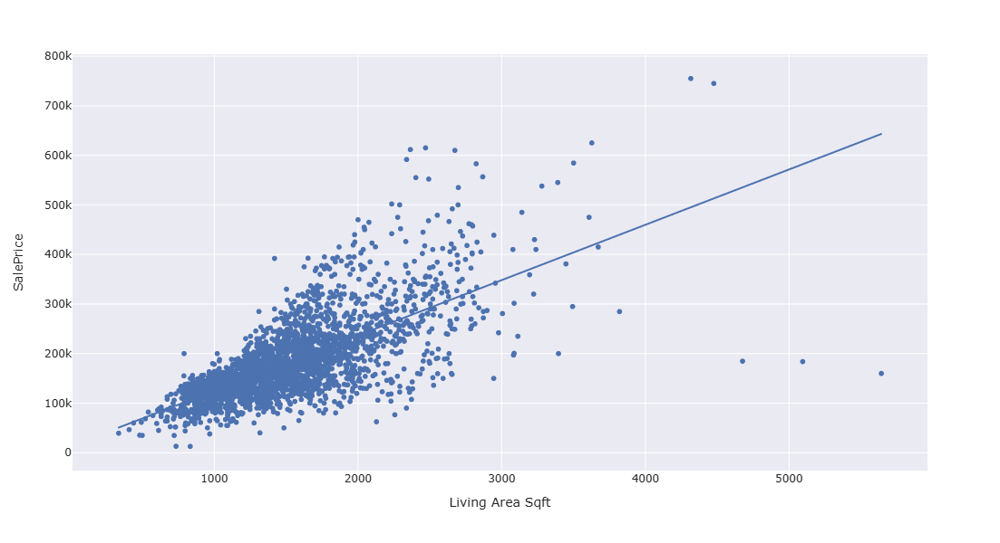

In [33]:
# Plot numeric vs numeric target with Plotly
pfig = px.scatter(df, x='Living Area Sqft', y="SalePrice",width=800, height=600, 
                 trendline='ols')
pfig

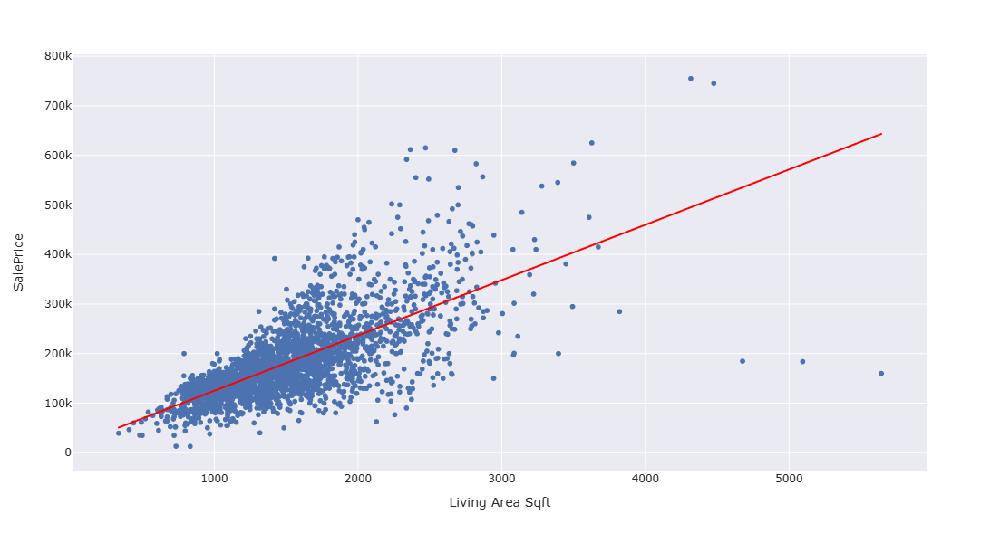

In [34]:
# Customizing the trendline
pfig = px.scatter(df, x='Living Area Sqft', y="SalePrice",width=800, height=600, 
                 trendline='ols', trendline_color_override='red')
pfig

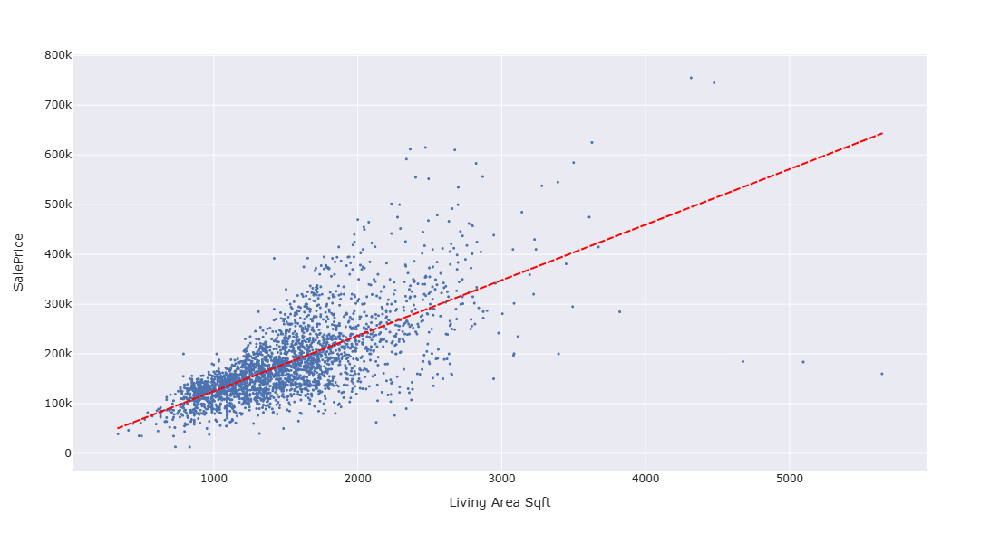

In [35]:
# Customizing the trendline
pfig = px.scatter(df, x='Living Area Sqft', y="SalePrice",width=800, height=600, 
                 trendline='ols',
                  trendline_color_override='red')
pfig.update_traces(marker=dict(size=3),
                  line=dict(dash='dash'))
pfig

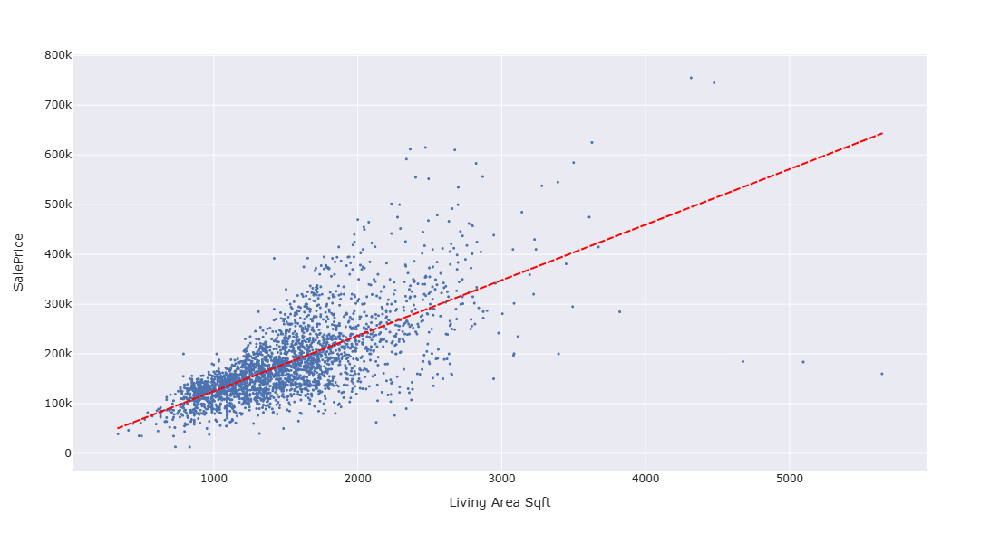

In [36]:
# Adding hover_data info
pfig = px.scatter(df, x='Living Area Sqft', y="SalePrice",width=800, height=600, #template='plotly_dark', 
                 trendline='ols',
                  trendline_color_override='red',
                  hover_data=list(df.columns)
                 )
pfig.update_traces(marker=dict(size=3),
                  line=dict(dash='dash'))
pfig

In [37]:
# functionizing numeric vs target
def plotly_numeric_vs_target(df, x, y='SalePrice', trendline='ols',add_hoverdata=True):
    if add_hoverdata == True:
        hover_data = list(df.columns)
    else: 
        hover_data = None
        
    pfig = px.scatter(df, x=x, y=y,width=800, height=600,
                     hover_data=hover_data,
                      trendline=trendline,
                      trendline_color_override='red',
                     title=f"{x} vs. {y}")
    
    pfig.update_traces(marker=dict(size=3),
                      line=dict(dash='dash'))
    return pfig

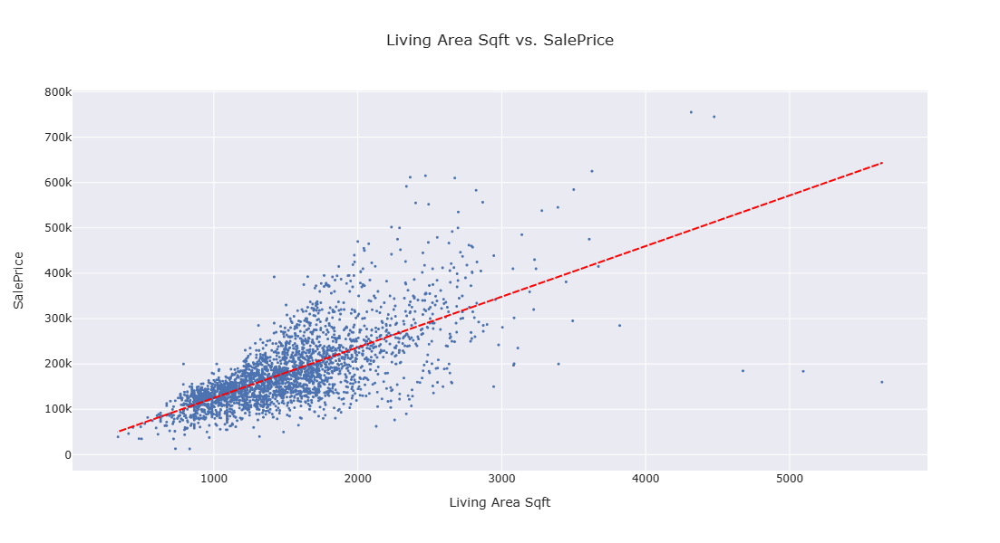

In [38]:
# Test the function
pfig = plotly_numeric_vs_target(df, 'Living Area Sqft', add_hoverdata=True)
pfig

## Preparing Files for Deployment

In [39]:
from pprint import pprint

FPATHS = dict(
    data={
        "raw": {
            "full": "data/ames-housing-dojo-for-ml.csv",  # (This is the original full dataframe we already have)
            "eda": "data/ames-housing-dojo-for-ml-eda.csv" # We haven't saved this yet
        },
        "ml": {
            "train": "data/training-data.joblib",  # (X_train,y_train) We haven't saved this yet
            "test": "data/testing-data.joblib",  # (X_test,y_test) We haven't saved this yet
        },
    },
    models={
        "linear_regression": "models/linear_regression/linreg.joblib", # We haven't saved this yet
        "random_forest": "models/random_forest/rf_reg.joblib", # We haven't saved this yet
    },
    images={
        "banner": "images/app-banner.png", # We haven't saved this yet
    },
)
pprint(FPATHS)

{'data': {'ml': {'test': 'data/testing-data.joblib',
                 'train': 'data/training-data.joblib'},
          'raw': {'eda': 'data/ames-housing-dojo-for-ml-eda.csv',
                  'full': 'data/ames-housing-dojo-for-ml.csv'}},
 'images': {'banner': 'images/app-banner.png'},
 'models': {'linear_regression': 'models/linear_regression/linreg.joblib',
            'random_forest': 'models/random_forest/rf_reg.joblib'}}


In [40]:
## Save the filepaths 
import os, json
os.makedirs('config/', exist_ok=True)
FPATHS_FILE = 'config/filepaths.json'
with open(FPATHS_FILE, 'w') as f:
    json.dump(FPATHS, f)

In [41]:
import os

def create_directories_from_paths(nested_dict):
    """OpenAI. (2023). ChatGPT [Large language model]. https://chat.openai.com 
    Recursively create directories for file paths in a nested dictionary.

    Parameters:
    nested_dict (dict): The nested dictionary containing file paths.
    """
    for key, value in nested_dict.items():
        if isinstance(value, dict):
            # If the value is a dictionary, recurse into it
            create_directories_from_paths(value)
        elif isinstance(value, str):
            # If the value is a string, treat it as a file path and get the directory path
            directory_path = os.path.dirname(value)
            # If the directory path is not empty and the directory does not exist, create it
            if directory_path and not os.path.exists(directory_path):
                os.makedirs(directory_path)
                print(f"Directory created: {directory_path}")

# Use the function on your FPATHS dictionary
create_directories_from_paths(FPATHS)

In [42]:
# We can access a file using our dictionary
FPATHS['data']['raw']['full']

'data/ames-housing-dojo-for-ml.csv'

In [43]:
# We can access a file using our dictionary
FPATHS['models']['random_forest']

'models/random_forest/rf_reg.joblib'

In [87]:
# Confirm the images is in the correct location
from IPython.display import display, Markdown
Markdown(f"<img src='{FPATHS['images']['banner']}'='>")

<img src='images/app-banner.png'='>

## Saving Files with Dictionary

In [45]:
# Import standard packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns',100)
# Import modeling tools
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
# Set DataFrames as default output
from sklearn import set_config
import joblib
set_config(transform_output='pandas')

In [46]:
import os, sys
%load_ext autoreload 
%autoreload 2
import custom_functions as fn

In [47]:
# Open the file structure dictionary
import json
with open('config/filepaths.json') as f:
    FPATHS = json.load(f)
FPATHS

{'data': {'raw': {'full': 'data/ames-housing-dojo-for-ml.csv',
   'eda': 'data/ames-housing-dojo-for-ml-eda.csv'},
  'ml': {'train': 'data/training-data.joblib',
   'test': 'data/testing-data.joblib'}},
 'models': {'linear_regression': 'models/linear_regression/linreg.joblib',
  'random_forest': 'models/random_forest/rf_reg.joblib'},
 'images': {'banner': 'images/app-banner.png'}}

### Load the full dataset

In [2]:
# Define the filepath using the new dictionary structure
fpath = FPATHS['data']['raw']['full']
# Read in as normal
df_full = pd.read_csv(fpath)
df_full = df_full.set_index("PID")
df_full.head()

NameError: name 'FPATHS' is not defined

### Prepare and save the eda dataset

In [49]:
# Defining which columns to keep for model
target  = "SalePrice"
features_to_use =['Living Area Sqft', 'Lot Frontage', 'Bldg Type', 'Bedroom',
                      'Total Full Baths','MS Zoning','Street', 
                      'Alley','Utilities']

In [50]:
# Make the df_eda with the target and selected features
df_eda = df_full[[target, *features_to_use]].copy()
df_eda

,SalePrice,Living Area Sqft,Lot Frontage,Bldg Type,Bedroom,Total Full Baths,MS Zoning,Street,Alley,Utilities
PID,,,,,,,,,,
907227090,119900.0,864.0,60.0,1Fam,3,1.0,RL,Pave,NaN,AllPub
527108010,320000.0,2462.0,134.0,1Fam,4,3.0,RL,Pave,NaN,AllPub
534275170,151500.0,958.0,NaN,1Fam,2,1.0,RL,Pave,NaN,AllPub
528104050,385000.0,2084.0,114.0,1Fam,2,3.0,RL,Pave,NaN,AllPub
533206070,193800.0,1565.0,32.0,TwnhsE,2,3.0,FV,Pave,Pave,AllPub
...,...,...,...,...,...,...,...,...,...,...
903400030,109000.0,816.0,50.0,1Fam,2,1.0,RL,Pave,Pave,AllPub
533234020,223000.0,1789.0,79.0,1Fam,3,3.0,FV,Pave,NaN,AllPub
908188140,137500.0,1709.0,24.0,Twnhs,3,2.0,RM,Pave,NaN,AllPub


In [51]:
# Define file path with dictionary
eda_file_path = FPATHS['data']['raw']['eda']
eda_file_path

'data/ames-housing-dojo-for-ml-eda.csv'

In [52]:
# Now save the eda version of the dataset using the dictionary
df_eda.to_csv(eda_file_path)

### Prepare and save the train and test data

In [53]:
# Separate features vs target & train/test split
target = "SalePrice"
X = df_eda.drop(columns = target)
y = df_eda[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42)
X_train

,Living Area Sqft,Lot Frontage,Bldg Type,Bedroom,Total Full Baths,MS Zoning,Street,Alley,Utilities
PID,,,,,,,,,
905475520,943.0,NaN,1Fam,3,1.0,RL,Pave,NaN,AllPub
909254010,1228.0,53.0,1Fam,3,1.0,RL,Pave,NaN,AllPub
531450090,1294.0,NaN,1Fam,3,3.0,RL,Pave,NaN,AllPub
903400040,1824.0,60.0,1Fam,3,1.0,RL,Pave,Pave,AllPub
527107130,1628.0,60.0,1Fam,3,2.0,RL,Pave,NaN,AllPub
...,...,...,...,...,...,...,...,...,...
527402220,1002.0,NaN,1Fam,3,2.0,RL,Pave,NaN,AllPub
528435030,1578.0,78.0,1Fam,3,2.0,RL,Pave,NaN,AllPub
528218090,1456.0,63.0,1Fam,3,2.0,RL,Pave,NaN,AllPub


In [54]:
# Defining the filepath for the training data using the dictionary
joblib_train_path = FPATHS['data']['ml']['train']
joblib_train_path

'data/training-data.joblib'

In [55]:
# Saving x-train and y-train a file using path from the dictionary
joblib.dump([X_train, y_train], joblib_train_path)

['data/training-data.joblib']

In [56]:
# Defining the filepath for the testing data using the dictionary
joblib_test_path = FPATHS['data']['ml']['test']
joblib_test_path

'data/testing-data.joblib'

In [57]:
# Saving x-train and y-train a file using path from the dictionary
joblib.dump([X_test, y_test], joblib_test_path)

['data/testing-data.joblib']

### Prepare and Save the Models

##### Preprocessing

In [58]:
# Make a preprocessing pipeline
# Separate lists of columns by dtype
num_cols = list(X_train.select_dtypes('number').columns)
ohe_cols = list(X_train.select_dtypes('object').columns)
# Categorical preprocessing pipeline (OHE)
impute_missing = SimpleImputer(strategy='constant', fill_value='MISSING')
ohe_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
ohe_pipe = make_pipeline(impute_missing, ohe_encoder)
# Numeric preprocessing pipeline
impute_nums = SimpleImputer(strategy='mean')
scaler = StandardScaler()
num_pipe = make_pipeline(impute_nums, scaler)
preprocessor = ColumnTransformer([('num', num_pipe, num_cols),
                                     ('cat',ohe_pipe, ohe_cols)],
                                    verbose_feature_names_out=False)
preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer()),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 ['Living Area Sqft', 'Lot Frontage', 'Bedroom',
                                  'Total Full Baths']),
                                ('cat',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value='MISSING',
                                                                strategy='constant')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['Bldg Type', 'MS Zoning', 'Street', 'Alley',
                                  'Utilities'])],
                  verbose_feature_names_out=False)

##### Linear Regression Pipeline

In [71]:
# Linear regression model
# Define model pipeline for linear regression
lin_reg_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('reg',LinearRegression())])
# Fit the model
lin_reg_pipe.fit(X_train, y_train)
# Make predictions and evaluate the model
results = evaluate_regression(lin_reg_pipe, X_train, y_train, X_test, y_test, output_frame=True)
results

------------------------------------------------------------
Regression Metrics: Training Data
------------------------------------------------------------
- MAE = 30,404.718
- MSE = 2,148,888,882.139
- RMSE = 46,356.109
- R^2 = 0.687

------------------------------------------------------------
Regression Metrics: Test Data
------------------------------------------------------------
- MAE = 28,349.283
- MSE = 1,723,809,957.483
- RMSE = 41,518.790
- R^2 = 0.648


,MAE,MSE,RMSE,R^2
Training Data,30404.718,2.148889e+09,46356.109,0.687
Test Data,28349.283,1.723810e+09,41518.790,0.648


In [67]:
#Get predictions for training and test data
y_pred_train = lin_reg_pipe.predict(X_train)
y_pred_test = lin_reg_pipe.predict(X_test)

In [68]:
# Define y_true and y_pred for the test data
y_true = y_test
y_pred = y_pred_test
# Provide a label for this data
label = 'Test Data'

In [69]:
# Calculating MAE with sklearn
from sklearn.metrics import mean_absolute_error
train_MAE = mean_absolute_error(y_train, y_pred_train)
test_MAE = mean_absolute_error(y_test, y_pred_test)

# Calculating MSE with sklearn
from sklearn.metrics import mean_squared_error
train_MSE = mean_squared_error(y_train, y_pred_train)
test_MSE = mean_squared_error(y_test, y_pred_test)

# Calculating RMSE with sklearn
train_RMSE = mean_squared_error(y_train, y_pred_train, squared=False)
test_RMSE = mean_squared_error(y_test, y_pred_test, squared=False)

from sklearn.metrics import r2_score
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)

In [70]:
# Define each regression metric
# Calculate MAE
mae = mean_absolute_error(y_true, y_pred)
# Calcualte MSE
mse = mean_squared_error(y_true, y_pred)
# Calculate RMSE
rmse = mean_squared_error(y_true, y_pred, squared=False) 
# Calculate R2
r_squared = r2_score(y_true, y_true)

In [64]:
def regression_metrics(y_true, y_pred, label='', verbose = True, output_dict=False):
  # Get metrics
  mae = mean_absolute_error(y_true, y_pred)
  mse = mean_squared_error(y_true, y_pred)
  rmse = mean_squared_error(y_true, y_pred, squared=False) 
  r_squared = r2_score(y_true, y_pred)
  if verbose == True:
    # Print Result with Label and Header
    header = "-"*60
    print(header, f"Regression Metrics: {label}", header, sep='\n')
    print(f"- MAE = {mae:,.3f}")
    print(f"- MSE = {mse:,.3f}")
    print(f"- RMSE = {rmse:,.3f}")
    print(f"- R^2 = {r_squared:,.3f}")
  if output_dict == True:
      metrics = {'Label':label, 'MAE':mae,
                 'MSE':mse, 'RMSE':rmse, 'R^2':r_squared}
      return metrics

In [65]:
def evaluate_regression(reg, X_train, y_train, X_test, y_test, verbose = True,
                        output_frame=False):
  # Get predictions for training data
  y_train_pred = reg.predict(X_train)
 
  # Call the helper function to obtain regression metrics for training data
  results_train = regression_metrics(y_train, y_train_pred, verbose = verbose,
                                     output_dict=output_frame,
                                     label='Training Data')
  print()
  # Get predictions for test data
  y_test_pred = reg.predict(X_test)
  # Call the helper function to obtain regression metrics for test data
  results_test = regression_metrics(y_test, y_test_pred, verbose = verbose,
                                  output_dict=output_frame,
                                    label='Test Data' )
  
  # Store results in a dataframe if ouput_frame is True
  if output_frame:
    results_df = pd.DataFrame([results_train,results_test])
    # Set the label as the index 
    results_df = results_df.set_index('Label')
    # Set index.name to none to get a cleaner looking result
    results_df.index.name=None
    # Return the dataframe
    return results_df.round(3)

In [72]:
# Now we can save our model using the filepath from the dictionary
linreg_path = FPATHS['models']['linear_regression']
linreg_path

'models/linear_regression/linreg.joblib'

In [73]:
# Save linear regression model in a file using path from the dictionary
joblib.dump(lin_reg_pipe, linreg_path)

['models/linear_regression/linreg.joblib']

##### Random Forest Pipeline

In [74]:
# Random Forest Pipeline
# Define model pipeline for random forest
rf_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('reg',RandomForestRegressor(max_depth=8, 
                                 min_samples_leaf=2, 
                                 random_state=42))])
# Fit the model
rf_pipe.fit(X_train, y_train)
# Make predictions and evaluate the model
results =evaluate_regression(rf_pipe, X_train, y_train, X_test, y_test, output_frame=True)
results

------------------------------------------------------------
Regression Metrics: Training Data
------------------------------------------------------------
- MAE = 21,389.213
- MSE = 963,180,022.141
- RMSE = 31,035.142
- R^2 = 0.860

------------------------------------------------------------
Regression Metrics: Test Data
------------------------------------------------------------
- MAE = 26,732.115
- MSE = 1,507,616,670.067
- RMSE = 38,828.040
- R^2 = 0.692


,MAE,MSE,RMSE,R^2
Training Data,21389.213,9.631800e+08,31035.142,0.860
Test Data,26732.115,1.507617e+09,38828.040,0.692


In [75]:
# Now we can save our model using the filepath from the dictionary
rf_path = FPATHS['models']['random_forest']
rf_path

'models/random_forest/rf_reg.joblib'

In [76]:
# Save random forest model in a file using path from the dictionary
joblib.dump(lin_reg_pipe, rf_path)

['models/random_forest/rf_reg.joblib']

## Getting Predictions on App

##### Load File Structure Dictonary

In [77]:
import json
with open ('config/filepaths.json') as f:
    FPATHS = json.load(f)
    
FPATHS.keys()

dict_keys(['data', 'models', 'images'])

In [78]:
FPATHS

{'data': {'raw': {'full': 'data/ames-housing-dojo-for-ml.csv',
   'eda': 'data/ames-housing-dojo-for-ml-eda.csv'},
  'ml': {'train': 'data/training-data.joblib',
   'test': 'data/testing-data.joblib'}},
 'models': {'linear_regression': 'models/linear_regression/linreg.joblib',
  'random_forest': 'models/random_forest/rf_reg.joblib'},
 'images': {'banner': 'images/app-banner.png'}}

##### Load Data

In [79]:
def load_data():
    fpath = FPATHS['data']['raw']['eda']
    df = pd.read_csv(fpath)
    df = df.set_index("PID")
    return df

In [80]:
# Load dataset
df = load_data()
df.head()

,SalePrice,Living Area Sqft,Lot Frontage,Bldg Type,Bedroom,Total Full Baths,MS Zoning,Street,Alley,Utilities
PID,,,,,,,,,,
907227090,119900.0,864.0,60.0,1Fam,3,1.0,RL,Pave,NaN,AllPub
527108010,320000.0,2462.0,134.0,1Fam,4,3.0,RL,Pave,NaN,AllPub
534275170,151500.0,958.0,NaN,1Fam,2,1.0,RL,Pave,NaN,AllPub
528104050,385000.0,2084.0,114.0,1Fam,2,3.0,RL,Pave,NaN,AllPub
533206070,193800.0,1565.0,32.0,TwnhsE,2,3.0,FV,Pave,Pave,AllPub


In [81]:
## define a function to load in the training and test data from our joblib file
def load_Xy_data(FPATHS, data_type='test'):
    filepath = FPATHS['data']['ml'][data_type]
    return joblib.load(filepath)

In [82]:
# Call function for train data
X_train, y_train = load_Xy_data(FPATHS, data_type='train')
# Call function for test data
X_test, y_test = load_Xy_data(FPATHS, data_type='test')

##### Load Models​

In [83]:
## Define function to load in model from dictionary with joblib
def load_model_ml(FPATHS,type='linear_regression'):
    filepath = FPATHS['models'][type]
    return joblib.load(filepath)

In [84]:
# Load models
linreg = load_model_ml(FPATHS, type='linear_regression')

##### Selecting Features

In [88]:
# Get list of all the features
X_train.columns

Index(['Living Area Sqft', 'Lot Frontage', 'Bldg Type', 'Bedroom',
       'Total Full Baths', 'MS Zoning', 'Street', 'Alley', 'Utilities'],
      dtype='object')

In [110]:
# Ultimately, our user will be able to select a value for each of the features on the app and obtain a prediction with the model
# Here we have defined selected values with the code

# Define a value for each feature
selected_sqft = 2000 # num
selected_lot_front =  100 # num
selected_bldg_type = "1Fam" # cat
selected_bedrooms = 2 # num
selected_total_full_baths = 2 # num
selected_ms_zoning = "RL" # cat
selected_street = 'Pave' # cat
selected_alley = "Pave" # cat
selected_utility = "AllPub" # cat

In [90]:
X_train.head(1)

,Living Area Sqft,Lot Frontage,Bldg Type,Bedroom,Total Full Baths,MS Zoning,Street,Alley,Utilities
PID,,,,,,,,,
905475520,943.0,NaN,1Fam,3,1.0,RL,Pave,NaN,AllPub


In [115]:
# Functionize the creation of the dataframe with selected values

def get_X_to_predict():
    X_to_predict = pd.DataFrame({'Living Area Sqft': selected_sqft,
                             'Lot Frontage': selected_lot_front, 
                             'Bldg Type': selected_bldg_type,
                             'Bedroom': selected_bedrooms,
                             'Total Full Baths':selected_total_full_baths,
                             'MS Zoning':selected_ms_zoning,
                             'Street':selected_street,
                             "Alley":selected_alley,
                             "Utilities":selected_utility},
                             index=['House'])
    return X_to_predict

In [116]:
# Call the function to create dataframe of selected features
X_to_predict = get_X_to_predict()
X_to_predict

,Living Area Sqft,Lot Frontage,Bldg Type,Bedroom,Total Full Baths,MS Zoning,Street,Alley,Utilities
House,2000,100,1Fam,2,2,RL,Pave,Pave,AllPub


##### Obtain Predictions

In [117]:
# Get Prediction
linreg.predict(X_to_predict)

array([252398.30867853])

In [118]:
# Get Prediction value
linreg.predict(X_to_predict)[0]

252398.30867852594

In [119]:
# Functionalize getting a prediction from the X_to_predict dataframe
def get_prediction(model,X_to_predict):
    return  model.predict(X_to_predict)[0]

In [120]:
# Obtain prediction from selected features
prediction = get_prediction(linreg, X_to_predict)
prediction

252398.30867852594

##### Interactive Feature Selection in the App

In [121]:
# Example of options for categorical column
df['Bldg Type'].unique()

array(['1Fam', 'TwnhsE', 'Duplex', 'Twnhs', '2fmCon'], dtype=object)

In [122]:
df['Living Area Sqft'].min()

334.0

In [123]:
df['Living Area Sqft'].max()

5642.0

##### Transform Data

In [125]:
# This is the transformed data after the first step in the pipeline (the preprocessor))
X_train_tf = lin_reg_pipe[0].transform(X_train)
X_train_tf.head()

,Living Area Sqft,Lot Frontage,Bedroom,Total Full Baths,Bldg Type_1Fam,Bldg Type_2fmCon,Bldg Type_Duplex,Bldg Type_Twnhs,Bldg Type_TwnhsE,MS Zoning_A (agr),MS Zoning_C (all),MS Zoning_FV,MS Zoning_I (all),MS Zoning_RH,MS Zoning_RL,MS Zoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,Utilities_AllPub,Utilities_NoSewr
PID,,,,,,,,,,,,,,,,,,,,,,,
905475520,-1.086450,-6.719278e-16,0.183403,-1.289289,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
909254010,-0.525568,-7.594931e-01,0.183403,-1.289289,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
531450090,-0.395679,-6.719278e-16,0.183403,1.343234,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
903400040,0.647364,-4.285141e-01,0.183403,-1.289289,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
527107130,0.261635,-4.285141e-01,0.183403,0.026973,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0


##### Create LIME Explainer Object

In [126]:
from lime.lime_tabular import LimeTabularExplainer

# Create the lime tabular explainer
explainer = LimeTabularExplainer(
    X_train_tf.values,
    mode="regression",
    feature_names=X_train_tf.columns,
    random_state=42,
)

##### Transform the Selected Values

In [127]:
# Review the format of the selected values
X_to_predict

,Living Area Sqft,Lot Frontage,Bldg Type,Bedroom,Total Full Baths,MS Zoning,Street,Alley,Utilities
House,2000,100,1Fam,2,2,RL,Pave,Pave,AllPub


In [128]:
# Apply preprcossor to selected values
X_to_predict_tf = lin_reg_pipe[0].transform(X_to_predict)
X_to_predict_tf

,Living Area Sqft,Lot Frontage,Bedroom,Total Full Baths,Bldg Type_1Fam,Bldg Type_2fmCon,Bldg Type_Duplex,Bldg Type_Twnhs,Bldg Type_TwnhsE,MS Zoning_A (agr),MS Zoning_C (all),MS Zoning_FV,MS Zoning_I (all),MS Zoning_RH,MS Zoning_RL,MS Zoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_MISSING,Alley_Pave,Utilities_AllPub,Utilities_NoSewr
House,0.993733,1.462794,-1.026618,0.026973,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0


##### Create Explanation for the Selected Values

In [129]:
# Specify first row
X_to_predict_tf.iloc[0]

Living Area Sqft     0.993733
Lot Frontage         1.462794
Bedroom             -1.026618
Total Full Baths     0.026973
Bldg Type_1Fam       1.000000
Bldg Type_2fmCon     0.000000
Bldg Type_Duplex     0.000000
Bldg Type_Twnhs      0.000000
Bldg Type_TwnhsE     0.000000
MS Zoning_A (agr)    0.000000
MS Zoning_C (all)    0.000000
MS Zoning_FV         0.000000
MS Zoning_I (all)    0.000000
MS Zoning_RH         0.000000
MS Zoning_RL         1.000000
MS Zoning_RM         0.000000
Street_Grvl          0.000000
Street_Pave          1.000000
Alley_Grvl           0.000000
Alley_MISSING        0.000000
Alley_Pave           1.000000
Utilities_AllPub     1.000000
Utilities_NoSewr     0.000000
Name: House, dtype: float64

In [130]:
# Accessing just the model from our pipeline
linreg[-1]

LinearRegression()

In [131]:
# Getting the explanation
explanation = explainer.explain_instance(X_to_predict_tf.iloc[0],
                                         linreg[-1].predict)
explanation

C:\Users\user\anaconda3\New anaconda\envs\dojo-env\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



In [132]:
explanation.show_in_notebook()

In [133]:
# Remove predction from view
explanation.show_in_notebook(show_predicted_value=False)

##### Functionalize code and add to the .py file

In [134]:
# Function to transform data and create explainer object

def get_explainer(model_pipe, X_train):
    X_train_tf = model_pipe[0].transform(X_train)

    explainer = LimeTabularExplainer(X_train_tf.values,
                                 feature_names=X_train_tf.columns,                                    
                                    random_state=42,
                                     mode='regression')

    return explainer

In [135]:
# Testing the function
explainer = get_explainer(linreg, X_train)
explainer

In [136]:
# Now that we have created the explainer, use it to explain the prediction of the selected values
def explain_instance(explainer, _model_pipe, X_to_explain):
    X_to_explain_tf = _model_pipe[0].transform(X_to_explain)
    explanation = explainer.explain_instance(X_to_explain_tf.iloc[0],
                                             _model_pipe[-1].predict)
    return explanation

In [138]:
# Teest function in our notebook
explanation = explain_instance(explainer, linreg, X_to_predict)
explanation.show_in_notebook(show_predicted_value=False)

C:\Users\user\anaconda3\New anaconda\envs\dojo-env\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



In [139]:
# Teest function in our notebook
explanation = explain_instance(explainer, linreg, X_to_predict)
explanation.show_in_notebook(show_predicted_value=True)

C:\Users\user\anaconda3\New anaconda\envs\dojo-env\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names

